# Constants

In [1]:
WIDTH = 730
HEIGHT = 530
CHANNELS = 3

BATCH_SIZE = 8
TRAIN_DATASET_NO = 3136

TEST_DATASET_NO = 348

SAMPLES_NO = TRAIN_DATASET_NO // BATCH_SIZE

DATA_PATH = "datasets/SUNRGB-D3D/SUNRGBD/kv2/kinect2data"
CSV_EXISTS = True

# Imports

In [2]:
%matplotlib inline

import os
import numpy as np
import json

from PIL import Image  
from csv import writer
import csv

from tensorflow import keras
import tensorflow as tf

import cv2
#The line above is necesary to show Matplotlib's plots inside a Jupyter Notebook
from matplotlib import pyplot as plt

/root/anaconda3/envs/implementare/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/root/anaconda3/envs/implementare/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/root/anaconda3/envs/implementare/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/root/anaconda3/envs/implementare/lib/python3.6/s

# Load dataset 

In [3]:
full_X = np.array([])
full_y = np.array([])

In [3]:
# Load the data from a .csv file or convert the annotations to csv

if CSV_EXISTS:
    full_y = np.genfromtxt('annotations_k2.csv',delimiter=',')
else:
    print(len(os.listdir(DATA_PATH)))

    leng = len(os.listdir(DATA_PATH))
    counter = 0.00

    # Open file in append mode
    with open('annotations_k2.csv', 'a+', newline='') as write_obj:
        # Create a writer object from csv module
        csv_writer = writer(write_obj)

        for file in os.listdir(DATA_PATH):
            print('Progress: ' + str(counter/leng))
            counter += 1
            sample_folder = os.path.join(DATA_PATH, file)
            if os.path.isdir(sample_folder):
                annotation_json = os.path.join(sample_folder, "annotation3Dfinal/index.json")

                with open(annotation_json) as annotation:
                    tmp = json.load(annotation)

                    for object_ in tmp['objects']:
                        if object_ == None:
                            continue

                        bounding_box = np.array([])

                        if len(object_['polygon']) == 0:
                            bounding_box = np.append(bounding_box, np.zeros(10))
                        else:
                            bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymin'])
                            bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymax'])
                            bounding_box = np.append(bounding_box, object_['polygon'][0]['X'])
                            bounding_box = np.append(bounding_box, object_['polygon'][0]['Z'])
                        
                        break
                        
                    # print(bounding_box)

                    # full_y
                    # tmp2 = np.append(tmp2, bounding_box)

                    # for i in range(0, 32-len(tmp['objects'])):
                        # tmp2 = np.append(tmp2, np.zeros(10))


                    # full_y = np.append(full_y, tmp2)
                    
                    # Add contents of list as last row in the csv file
                    csv_writer.writerow(bounding_box)

In [4]:
# Load the data from a .csv file or convert the images to csv

if CSV_EXISTS:
    pass
else:
    print(len(os.listdir(DATA_PATH)))

    leng = len(os.listdir(DATA_PATH))
    counter = 0.00

    # Open file in append mode
    with open('images_k2.csv', 'a+', newline='') as write_obj:
        # Create a writer object from csv module
        csv_writer = writer(write_obj)

        for file in os.listdir(DATA_PATH):
            print('Progress: ' + str(counter/leng) + ' ' + str(counter))
            counter += 1
            sample_folder = os.path.join(DATA_PATH, file)
            if os.path.isdir(sample_folder):

                image_folder = os.path.join(sample_folder, "image")
                for image_name in os.listdir(image_folder):
                    image = Image.open(os.path.join(image_folder, image_name))
                    
                    sample_image = np.asarray(image)
                    # full_X = np.append(full_X, sample_image)

                    # Add contents of list as last row in the csv file
                    csv_writer.writerow(sample_image.flatten())
                    
                    break

In [15]:
leng = len(os.listdir(DATA_PATH))
counter = 0.00

# Open file in append mode
with open('train_annotations_3dbb_k2.csv', 'a+', newline='') as write_train_y, \
     open('test_annotations_3dbb_k2.csv', 'a+', newline='') as write_test_y:
    # Create a writer object from csv module
    csv_train_y = writer(write_train_y)
    csv_test_y = writer(write_test_y)

    writer_y = csv_train_y
        
    data_counter = 0

    for file in os.listdir(DATA_PATH):

        # Change to test data
        if data_counter > TRAIN_DATASET_NO:
            writer_y = csv_test_y
                
        # Stop after we get all the wanted test data 
        if data_counter - TRAIN_DATASET_NO == TEST_DATASET_NO:
            break
            
        print('Progress: ' + str(counter/leng))
        counter += 1
        sample_folder = os.path.join(DATA_PATH, file)
        if os.path.isdir(sample_folder):
            annotation_json = os.path.join(sample_folder, "annotation3Dfinal/index.json")

            with open(annotation_json) as annotation:
                tmp = json.load(annotation)

                for object_ in tmp['objects']:
                    if object_ == None:
                        continue

                    bounding_box = np.array([])

                    if len(object_['polygon']) == 0:
                        bounding_box = np.append(bounding_box, np.zeros(10))
                    else:
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymin'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymax'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['X'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Z'])
                        
                    break
                    
            calib = SUNRGBD_Calibration(sample_folder)

            obj = SUNObject3d(compute_3d_annotations(bounding_box_3d))
                    
            corners_2d, _ = compute_box_3d(obj, calib)

            # Normalize the corners between (-1, 1)
            corners_2d[:, 0] /= WIDTH
            corners_2d[:, 1] /= HEIGHT
            
            writer_y.writerow(corners_2d.flatten())
        
        data_counter += 1

Progress: 0.0
Progress: 0.00028686173264486515
Progress: 0.0005737234652897303
Progress: 0.0008605851979345956
Progress: 0.0011474469305794606
Progress: 0.001434308663224326
Progress: 0.0017211703958691911
Progress: 0.002008032128514056
Progress: 0.002294893861158921
Progress: 0.0025817555938037868
Progress: 0.002868617326448652
Progress: 0.003155479059093517
Progress: 0.0034423407917383822
Progress: 0.0037292025243832474
Progress: 0.004016064257028112
Progress: 0.004302925989672977
Progress: 0.004589787722317842
Progress: 0.004876649454962708
Progress: 0.0051635111876075735
Progress: 0.005450372920252439
Progress: 0.005737234652897304
Progress: 0.006024096385542169
Progress: 0.006310958118187034
Progress: 0.006597819850831899
Progress: 0.0068846815834767644
Progress: 0.00717154331612163
Progress: 0.007458405048766495
Progress: 0.00774526678141136
Progress: 0.008032128514056224
Progress: 0.00831899024670109
Progress: 0.008605851979345954
Progress: 0.00889271371199082
Progress: 0.009179

Progress: 0.0783132530120482
Progress: 0.07860011474469306
Progress: 0.07888697647733792
Progress: 0.07917383820998279
Progress: 0.07946069994262765
Progress: 0.07974756167527251
Progress: 0.08003442340791739
Progress: 0.08032128514056225
Progress: 0.08060814687320711
Progress: 0.08089500860585198
Progress: 0.08118187033849684
Progress: 0.0814687320711417
Progress: 0.08175559380378658
Progress: 0.08204245553643144
Progress: 0.0823293172690763
Progress: 0.08261617900172118
Progress: 0.08290304073436604
Progress: 0.0831899024670109
Progress: 0.08347676419965576
Progress: 0.08376362593230063
Progress: 0.0840504876649455
Progress: 0.08433734939759036
Progress: 0.08462421113023523
Progress: 0.08491107286288009
Progress: 0.08519793459552495
Progress: 0.08548479632816983
Progress: 0.08577165806081469
Progress: 0.08605851979345955
Progress: 0.08634538152610442
Progress: 0.08663224325874928
Progress: 0.08691910499139414
Progress: 0.08720596672403902
Progress: 0.08749282845668388
Progress: 0.087

Progress: 0.15863453815261044
Progress: 0.1589213998852553
Progress: 0.15920826161790017
Progress: 0.15949512335054503
Progress: 0.15978198508318991
Progress: 0.16006884681583478
Progress: 0.16035570854847964
Progress: 0.1606425702811245
Progress: 0.16092943201376936
Progress: 0.16121629374641422
Progress: 0.1615031554790591
Progress: 0.16179001721170397
Progress: 0.16207687894434883
Progress: 0.1623637406769937
Progress: 0.16265060240963855
Progress: 0.1629374641422834
Progress: 0.16322432587492827
Progress: 0.16351118760757316
Progress: 0.16379804934021802
Progress: 0.16408491107286288
Progress: 0.16437177280550774
Progress: 0.1646586345381526
Progress: 0.16494549627079746
Progress: 0.16523235800344235
Progress: 0.16551921973608721
Progress: 0.16580608146873207
Progress: 0.16609294320137694
Progress: 0.1663798049340218
Progress: 0.16666666666666666
Progress: 0.16695352839931152
Progress: 0.1672403901319564
Progress: 0.16752725186460127
Progress: 0.16781411359724613
Progress: 0.168100

Progress: 0.23838209982788297
Progress: 0.23866896156052783
Progress: 0.2389558232931727
Progress: 0.23924268502581755
Progress: 0.2395295467584624
Progress: 0.23981640849110727
Progress: 0.24010327022375216
Progress: 0.24039013195639702
Progress: 0.24067699368904188
Progress: 0.24096385542168675
Progress: 0.2412507171543316
Progress: 0.24153757888697647
Progress: 0.24182444061962136
Progress: 0.24211130235226622
Progress: 0.24239816408491108
Progress: 0.24268502581755594
Progress: 0.2429718875502008
Progress: 0.24325874928284566
Progress: 0.24354561101549052
Progress: 0.2438324727481354
Progress: 0.24411933448078027
Progress: 0.24440619621342513
Progress: 0.24469305794607
Progress: 0.24497991967871485
Progress: 0.2452667814113597
Progress: 0.2455536431440046
Progress: 0.24584050487664946
Progress: 0.24612736660929432
Progress: 0.24641422834193918
Progress: 0.24670109007458405
Progress: 0.2469879518072289
Progress: 0.2472748135398738
Progress: 0.24756167527251866
Progress: 0.2478485370

Progress: 0.31956397016637983
Progress: 0.3198508318990247
Progress: 0.32013769363166955
Progress: 0.3204245553643144
Progress: 0.3207114170969593
Progress: 0.32099827882960413
Progress: 0.321285140562249
Progress: 0.32157200229489386
Progress: 0.3218588640275387
Progress: 0.3221457257601836
Progress: 0.32243258749282844
Progress: 0.3227194492254733
Progress: 0.3230063109581182
Progress: 0.3232931726907631
Progress: 0.32358003442340794
Progress: 0.3238668961560528
Progress: 0.32415375788869766
Progress: 0.3244406196213425
Progress: 0.3247274813539874
Progress: 0.32501434308663224
Progress: 0.3253012048192771
Progress: 0.32558806655192196
Progress: 0.3258749282845668
Progress: 0.3261617900172117
Progress: 0.32644865174985654
Progress: 0.32673551348250146
Progress: 0.3270223752151463
Progress: 0.3273092369477912
Progress: 0.32759609868043604
Progress: 0.3278829604130809
Progress: 0.32816982214572576
Progress: 0.3284566838783706
Progress: 0.3287435456110155
Progress: 0.32903040734366035
P

Progress: 0.39959839357429716
Progress: 0.3998852553069421
Progress: 0.40017211703958694
Progress: 0.4004589787722318
Progress: 0.40074584050487666
Progress: 0.4010327022375215
Progress: 0.4013195639701664
Progress: 0.40160642570281124
Progress: 0.4018932874354561
Progress: 0.40218014916810096
Progress: 0.4024670109007458
Progress: 0.4027538726333907
Progress: 0.40304073436603555
Progress: 0.40332759609868046
Progress: 0.4036144578313253
Progress: 0.4039013195639702
Progress: 0.40418818129661505
Progress: 0.4044750430292599
Progress: 0.40476190476190477
Progress: 0.40504876649454963
Progress: 0.4053356282271945
Progress: 0.40562248995983935
Progress: 0.4059093516924842
Progress: 0.40619621342512907
Progress: 0.40648307515777393
Progress: 0.4067699368904188
Progress: 0.4070567986230637
Progress: 0.40734366035570857
Progress: 0.40763052208835343
Progress: 0.4079173838209983
Progress: 0.40820424555364315
Progress: 0.408491107286288
Progress: 0.4087779690189329
Progress: 0.4090648307515777

Progress: 0.48135398737808377
Progress: 0.48164084911072863
Progress: 0.4819277108433735
Progress: 0.48221457257601835
Progress: 0.4825014343086632
Progress: 0.4827882960413081
Progress: 0.48307515777395293
Progress: 0.4833620195065978
Progress: 0.4836488812392427
Progress: 0.4839357429718876
Progress: 0.48422260470453243
Progress: 0.4845094664371773
Progress: 0.48479632816982215
Progress: 0.485083189902467
Progress: 0.4853700516351119
Progress: 0.48565691336775674
Progress: 0.4859437751004016
Progress: 0.48623063683304646
Progress: 0.4865174985656913
Progress: 0.4868043602983362
Progress: 0.48709122203098104
Progress: 0.48737808376362596
Progress: 0.4876649454962708
Progress: 0.4879518072289157
Progress: 0.48823866896156054
Progress: 0.4885255306942054
Progress: 0.48881239242685026
Progress: 0.4890992541594951
Progress: 0.48938611589214
Progress: 0.48967297762478484
Progress: 0.4899598393574297
Progress: 0.49024670109007457
Progress: 0.4905335628227194
Progress: 0.4908204245553643
Pro

Progress: 0.5628227194492255
Progress: 0.5631095811818704
Progress: 0.5633964429145152
Progress: 0.5636833046471601
Progress: 0.5639701663798049
Progress: 0.5642570281124498
Progress: 0.5645438898450946
Progress: 0.5648307515777395
Progress: 0.5651176133103843
Progress: 0.5654044750430293
Progress: 0.5656913367756741
Progress: 0.565978198508319
Progress: 0.5662650602409639
Progress: 0.5665519219736087
Progress: 0.5668387837062536
Progress: 0.5671256454388984
Progress: 0.5674125071715433
Progress: 0.5676993689041882
Progress: 0.5679862306368331
Progress: 0.5682730923694779
Progress: 0.5685599541021228
Progress: 0.5688468158347676
Progress: 0.5691336775674125
Progress: 0.5694205393000574
Progress: 0.5697074010327022
Progress: 0.5699942627653471
Progress: 0.570281124497992
Progress: 0.5705679862306369
Progress: 0.5708548479632817
Progress: 0.5711417096959266
Progress: 0.5714285714285714
Progress: 0.5717154331612163
Progress: 0.5720022948938611
Progress: 0.572289156626506
Progress: 0.57257

Progress: 0.6457257601835915
Progress: 0.6460126219162364
Progress: 0.6462994836488812
Progress: 0.6465863453815262
Progress: 0.646873207114171
Progress: 0.6471600688468159
Progress: 0.6474469305794607
Progress: 0.6477337923121056
Progress: 0.6480206540447504
Progress: 0.6483075157773953
Progress: 0.6485943775100401
Progress: 0.648881239242685
Progress: 0.6491681009753298
Progress: 0.6494549627079748
Progress: 0.6497418244406197
Progress: 0.6500286861732645
Progress: 0.6503155479059094
Progress: 0.6506024096385542
Progress: 0.6508892713711991
Progress: 0.6511761331038439
Progress: 0.6514629948364888
Progress: 0.6517498565691336
Progress: 0.6520367183017786
Progress: 0.6523235800344234
Progress: 0.6526104417670683
Progress: 0.6528973034997131
Progress: 0.653184165232358
Progress: 0.6534710269650029
Progress: 0.6537578886976477
Progress: 0.6540447504302926
Progress: 0.6543316121629374
Progress: 0.6546184738955824
Progress: 0.6549053356282272
Progress: 0.6551921973608721
Progress: 0.65547

Progress: 0.7289156626506024
Progress: 0.7292025243832473
Progress: 0.7294893861158921
Progress: 0.729776247848537
Progress: 0.7300631095811819
Progress: 0.7303499713138267
Progress: 0.7306368330464716
Progress: 0.7309236947791165
Progress: 0.7312105565117614
Progress: 0.7314974182444062
Progress: 0.7317842799770511
Progress: 0.7320711417096959
Progress: 0.7323580034423408
Progress: 0.7326448651749856
Progress: 0.7329317269076305
Progress: 0.7332185886402753
Progress: 0.7335054503729203
Progress: 0.7337923121055652
Progress: 0.73407917383821
Progress: 0.7343660355708549
Progress: 0.7346528973034997
Progress: 0.7349397590361446
Progress: 0.7352266207687894
Progress: 0.7355134825014343
Progress: 0.7358003442340791
Progress: 0.7360872059667241
Progress: 0.7363740676993689
Progress: 0.7366609294320138
Progress: 0.7369477911646586
Progress: 0.7372346528973035
Progress: 0.7375215146299484
Progress: 0.7378083763625932
Progress: 0.7380952380952381
Progress: 0.7383820998278829
Progress: 0.73866

Progress: 0.8112449799196787
Progress: 0.8115318416523236
Progress: 0.8118187033849684
Progress: 0.8121055651176133
Progress: 0.8123924268502581
Progress: 0.8126792885829031
Progress: 0.8129661503155479
Progress: 0.8132530120481928
Progress: 0.8135398737808376
Progress: 0.8138267355134825
Progress: 0.8141135972461274
Progress: 0.8144004589787722
Progress: 0.8146873207114171
Progress: 0.814974182444062
Progress: 0.8152610441767069
Progress: 0.8155479059093517
Progress: 0.8158347676419966
Progress: 0.8161216293746414
Progress: 0.8164084911072863
Progress: 0.8166953528399311
Progress: 0.816982214572576
Progress: 0.8172690763052208
Progress: 0.8175559380378657
Progress: 0.8178427997705107
Progress: 0.8181296615031555
Progress: 0.8184165232358004
Progress: 0.8187033849684452
Progress: 0.8189902467010901
Progress: 0.8192771084337349
Progress: 0.8195639701663798
Progress: 0.8198508318990246
Progress: 0.8201376936316696
Progress: 0.8204245553643144
Progress: 0.8207114170969593
Progress: 0.8209

Progress: 0.8932874354561101
Progress: 0.893574297188755
Progress: 0.8938611589213998
Progress: 0.8941480206540448
Progress: 0.8944348823866897
Progress: 0.8947217441193345
Progress: 0.8950086058519794
Progress: 0.8952954675846242
Progress: 0.8955823293172691
Progress: 0.8958691910499139
Progress: 0.8961560527825588
Progress: 0.8964429145152036
Progress: 0.8967297762478486
Progress: 0.8970166379804934
Progress: 0.8973034997131383
Progress: 0.8975903614457831
Progress: 0.897877223178428
Progress: 0.8981640849110729
Progress: 0.8984509466437177
Progress: 0.8987378083763626
Progress: 0.8990246701090074
Progress: 0.8993115318416524
Progress: 0.8995983935742972
Progress: 0.8998852553069421
Progress: 0.9001721170395869
Progress: 0.9004589787722318
Progress: 0.9007458405048766
Progress: 0.9010327022375215
Progress: 0.9013195639701663
Progress: 0.9016064257028112
Progress: 0.9018932874354562
Progress: 0.902180149168101
Progress: 0.9024670109007459
Progress: 0.9027538726333907
Progress: 0.90304

Progress: 0.9753298909925416
Progress: 0.9756167527251864
Progress: 0.9759036144578314
Progress: 0.9761904761904762
Progress: 0.9764773379231211
Progress: 0.9767641996557659
Progress: 0.9770510613884108
Progress: 0.9773379231210556
Progress: 0.9776247848537005
Progress: 0.9779116465863453
Progress: 0.9781985083189902
Progress: 0.9784853700516352
Progress: 0.97877223178428
Progress: 0.9790590935169249
Progress: 0.9793459552495697
Progress: 0.9796328169822146
Progress: 0.9799196787148594
Progress: 0.9802065404475043
Progress: 0.9804934021801491
Progress: 0.980780263912794
Progress: 0.9810671256454389
Progress: 0.9813539873780838
Progress: 0.9816408491107286
Progress: 0.9819277108433735
Progress: 0.9822145725760184
Progress: 0.9825014343086632
Progress: 0.9827882960413081
Progress: 0.9830751577739529
Progress: 0.9833620195065979
Progress: 0.9836488812392427
Progress: 0.9839357429718876
Progress: 0.9842226047045324
Progress: 0.9845094664371773
Progress: 0.9847963281698221
Progress: 0.98508

In [5]:
# Load the data from a .csv file or convert the annotations to csv

print(len(os.listdir(DATA_PATH)))

leng = len(os.listdir(DATA_PATH))
counter = 0.00

# Open file in append mode
with open('train_images_k2.csv', 'a+', newline='') as write_train_X, \
    open('train_annotations_k2.csv', 'a+', newline='') as write_train_y, \
    open('test_images_k2.csv', 'a+', newline='') as write_test_X, \
    open('test_annotations_k2.csv', 'a+', newline='') as write_test_y:
    
    # Create a writer object from csv module
    csv_train_X = writer(write_train_X)
    csv_train_y = writer(write_train_y)
    csv_test_X = writer(write_test_X)
    csv_test_y = writer(write_test_y)

    writer_X = csv_train_X
    writer_y = csv_train_y
        
    data_counter = 0
        
    for file in os.listdir(DATA_PATH):
            
        # Change to test data
        if data_counter > TRAIN_DATASET_NO:
            writer_X = csv_test_X
            writer_y = csv_test_y
                
        # Stop after we get all the wanted test data 
        if data_counter - TRAIN_DATASET_NO == TEST_DATASET_NO:
            break
            
        print('Progress: ' + str(counter/leng))
        counter += 1
        sample_folder = os.path.join(DATA_PATH, file)
        if os.path.isdir(sample_folder):
            annotation_json = os.path.join(sample_folder, "annotation3Dfinal/index.json")

            with open(annotation_json) as annotation:
                tmp = json.load(annotation)

                for object_ in tmp['objects']:
                    if object_ == None:
                        continue

                    bounding_box = np.array([])

                    if len(object_['polygon']) == 0:
                        bounding_box = np.append(bounding_box, np.zeros(10))
                    else:
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymin'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Ymax'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['X'])
                        bounding_box = np.append(bounding_box, object_['polygon'][0]['Z'])

                    break
                    
                # Add contents of list as last row in the csv file
                writer_y.writerow(bounding_box)
                    
        if os.path.isdir(sample_folder):

            image_folder = os.path.join(sample_folder, "image")
            for image_name in os.listdir(image_folder):
                image = Image.open(os.path.join(image_folder, image_name))
                    
                sample_image = np.asarray(image)
                # full_X = np.append(full_X, sample_image)

                # Add contents of list as last row in the csv file
                writer_X.writerow(sample_image.flatten())

                break


        data_counter += 1

3486
Progress: 0.0
Progress: 0.00028686173264486515
Progress: 0.0005737234652897303
Progress: 0.0008605851979345956
Progress: 0.0011474469305794606
Progress: 0.001434308663224326
Progress: 0.0017211703958691911
Progress: 0.002008032128514056
Progress: 0.002294893861158921
Progress: 0.0025817555938037868
Progress: 0.002868617326448652
Progress: 0.003155479059093517
Progress: 0.0034423407917383822
Progress: 0.0037292025243832474
Progress: 0.004016064257028112
Progress: 0.004302925989672977
Progress: 0.004589787722317842
Progress: 0.004876649454962708
Progress: 0.0051635111876075735
Progress: 0.005450372920252439
Progress: 0.005737234652897304
Progress: 0.006024096385542169
Progress: 0.006310958118187034
Progress: 0.006597819850831899
Progress: 0.0068846815834767644
Progress: 0.00717154331612163
Progress: 0.007458405048766495
Progress: 0.00774526678141136
Progress: 0.008032128514056224
Progress: 0.00831899024670109
Progress: 0.008605851979345954
Progress: 0.00889271371199082
Progress: 0.0

Progress: 0.07773952954675846
Progress: 0.07802639127940333
Progress: 0.0783132530120482
Progress: 0.07860011474469306
Progress: 0.07888697647733792
Progress: 0.07917383820998279
Progress: 0.07946069994262765
Progress: 0.07974756167527251
Progress: 0.08003442340791739
Progress: 0.08032128514056225
Progress: 0.08060814687320711
Progress: 0.08089500860585198
Progress: 0.08118187033849684
Progress: 0.0814687320711417
Progress: 0.08175559380378658
Progress: 0.08204245553643144
Progress: 0.0823293172690763
Progress: 0.08261617900172118
Progress: 0.08290304073436604
Progress: 0.0831899024670109
Progress: 0.08347676419965576
Progress: 0.08376362593230063
Progress: 0.0840504876649455
Progress: 0.08433734939759036
Progress: 0.08462421113023523
Progress: 0.08491107286288009
Progress: 0.08519793459552495
Progress: 0.08548479632816983
Progress: 0.08577165806081469
Progress: 0.08605851979345955
Progress: 0.08634538152610442
Progress: 0.08663224325874928
Progress: 0.08691910499139414
Progress: 0.087

Progress: 0.15691336775674125
Progress: 0.1572002294893861
Progress: 0.15748709122203097
Progress: 0.15777395295467583
Progress: 0.15806081468732072
Progress: 0.15834767641996558
Progress: 0.15863453815261044
Progress: 0.1589213998852553
Progress: 0.15920826161790017
Progress: 0.15949512335054503
Progress: 0.15978198508318991
Progress: 0.16006884681583478
Progress: 0.16035570854847964
Progress: 0.1606425702811245
Progress: 0.16092943201376936
Progress: 0.16121629374641422
Progress: 0.1615031554790591
Progress: 0.16179001721170397
Progress: 0.16207687894434883
Progress: 0.1623637406769937
Progress: 0.16265060240963855
Progress: 0.1629374641422834
Progress: 0.16322432587492827
Progress: 0.16351118760757316
Progress: 0.16379804934021802
Progress: 0.16408491107286288
Progress: 0.16437177280550774
Progress: 0.1646586345381526
Progress: 0.16494549627079746
Progress: 0.16523235800344235
Progress: 0.16551921973608721
Progress: 0.16580608146873207
Progress: 0.16609294320137694
Progress: 0.16637

Progress: 0.23608720596672403
Progress: 0.23637406769936892
Progress: 0.23666092943201378
Progress: 0.23694779116465864
Progress: 0.2372346528973035
Progress: 0.23752151462994836
Progress: 0.23780837636259322
Progress: 0.23809523809523808
Progress: 0.23838209982788297
Progress: 0.23866896156052783
Progress: 0.2389558232931727
Progress: 0.23924268502581755
Progress: 0.2395295467584624
Progress: 0.23981640849110727
Progress: 0.24010327022375216
Progress: 0.24039013195639702
Progress: 0.24067699368904188
Progress: 0.24096385542168675
Progress: 0.2412507171543316
Progress: 0.24153757888697647
Progress: 0.24182444061962136
Progress: 0.24211130235226622
Progress: 0.24239816408491108
Progress: 0.24268502581755594
Progress: 0.2429718875502008
Progress: 0.24325874928284566
Progress: 0.24354561101549052
Progress: 0.2438324727481354
Progress: 0.24411933448078027
Progress: 0.24440619621342513
Progress: 0.24469305794607
Progress: 0.24497991967871485
Progress: 0.2452667814113597
Progress: 0.24555364

Progress: 0.31612162937464144
Progress: 0.3164084911072863
Progress: 0.31669535283993117
Progress: 0.316982214572576
Progress: 0.3172690763052209
Progress: 0.31755593803786575
Progress: 0.3178427997705106
Progress: 0.31812966150315547
Progress: 0.31841652323580033
Progress: 0.3187033849684452
Progress: 0.31899024670109005
Progress: 0.3192771084337349
Progress: 0.31956397016637983
Progress: 0.3198508318990247
Progress: 0.32013769363166955
Progress: 0.3204245553643144
Progress: 0.3207114170969593
Progress: 0.32099827882960413
Progress: 0.321285140562249
Progress: 0.32157200229489386
Progress: 0.3218588640275387
Progress: 0.3221457257601836
Progress: 0.32243258749282844
Progress: 0.3227194492254733
Progress: 0.3230063109581182
Progress: 0.3232931726907631
Progress: 0.32358003442340794
Progress: 0.3238668961560528
Progress: 0.32415375788869766
Progress: 0.3244406196213425
Progress: 0.3247274813539874
Progress: 0.32501434308663224
Progress: 0.3253012048192771
Progress: 0.32558806655192196
P

Progress: 0.39615605278255883
Progress: 0.3964429145152037
Progress: 0.39672977624784855
Progress: 0.3970166379804934
Progress: 0.3973034997131383
Progress: 0.39759036144578314
Progress: 0.397877223178428
Progress: 0.39816408491107286
Progress: 0.3984509466437177
Progress: 0.3987378083763626
Progress: 0.39902467010900744
Progress: 0.3993115318416523
Progress: 0.39959839357429716
Progress: 0.3998852553069421
Progress: 0.40017211703958694
Progress: 0.4004589787722318
Progress: 0.40074584050487666
Progress: 0.4010327022375215
Progress: 0.4013195639701664
Progress: 0.40160642570281124
Progress: 0.4018932874354561
Progress: 0.40218014916810096
Progress: 0.4024670109007458
Progress: 0.4027538726333907
Progress: 0.40304073436603555
Progress: 0.40332759609868046
Progress: 0.4036144578313253
Progress: 0.4039013195639702
Progress: 0.40418818129661505
Progress: 0.4044750430292599
Progress: 0.40476190476190477
Progress: 0.40504876649454963
Progress: 0.4053356282271945
Progress: 0.40562248995983935

Progress: 0.47619047619047616
Progress: 0.4764773379231211
Progress: 0.47676419965576594
Progress: 0.4770510613884108
Progress: 0.47733792312105566
Progress: 0.4776247848537005
Progress: 0.4779116465863454
Progress: 0.47819850831899025
Progress: 0.4784853700516351
Progress: 0.47877223178427997
Progress: 0.4790590935169248
Progress: 0.4793459552495697
Progress: 0.47963281698221455
Progress: 0.4799196787148594
Progress: 0.4802065404475043
Progress: 0.4804934021801492
Progress: 0.48078026391279405
Progress: 0.4810671256454389
Progress: 0.48135398737808377
Progress: 0.48164084911072863
Progress: 0.4819277108433735
Progress: 0.48221457257601835
Progress: 0.4825014343086632
Progress: 0.4827882960413081
Progress: 0.48307515777395293
Progress: 0.4833620195065978
Progress: 0.4836488812392427
Progress: 0.4839357429718876
Progress: 0.48422260470453243
Progress: 0.4845094664371773
Progress: 0.48479632816982215
Progress: 0.485083189902467
Progress: 0.4853700516351119
Progress: 0.48565691336775674
P

Progress: 0.557372346528973
Progress: 0.5576592082616179
Progress: 0.5579460699942628
Progress: 0.5582329317269076
Progress: 0.5585197934595525
Progress: 0.5588066551921974
Progress: 0.5590935169248422
Progress: 0.5593803786574871
Progress: 0.5596672403901319
Progress: 0.5599541021227769
Progress: 0.5602409638554217
Progress: 0.5605278255880666
Progress: 0.5608146873207114
Progress: 0.5611015490533563
Progress: 0.5613884107860011
Progress: 0.561675272518646
Progress: 0.5619621342512908
Progress: 0.5622489959839357
Progress: 0.5625358577165807
Progress: 0.5628227194492255
Progress: 0.5631095811818704
Progress: 0.5633964429145152
Progress: 0.5636833046471601
Progress: 0.5639701663798049
Progress: 0.5642570281124498
Progress: 0.5645438898450946
Progress: 0.5648307515777395
Progress: 0.5651176133103843
Progress: 0.5654044750430293
Progress: 0.5656913367756741
Progress: 0.565978198508319
Progress: 0.5662650602409639
Progress: 0.5665519219736087
Progress: 0.5668387837062536
Progress: 0.56712

Progress: 0.6388410786001147
Progress: 0.6391279403327597
Progress: 0.6394148020654045
Progress: 0.6397016637980494
Progress: 0.6399885255306942
Progress: 0.6402753872633391
Progress: 0.6405622489959839
Progress: 0.6408491107286288
Progress: 0.6411359724612736
Progress: 0.6414228341939185
Progress: 0.6417096959265634
Progress: 0.6419965576592083
Progress: 0.6422834193918531
Progress: 0.642570281124498
Progress: 0.6428571428571429
Progress: 0.6431440045897877
Progress: 0.6434308663224326
Progress: 0.6437177280550774
Progress: 0.6440045897877223
Progress: 0.6442914515203672
Progress: 0.6445783132530121
Progress: 0.6448651749856569
Progress: 0.6451520367183018
Progress: 0.6454388984509466
Progress: 0.6457257601835915
Progress: 0.6460126219162364
Progress: 0.6462994836488812
Progress: 0.6465863453815262
Progress: 0.646873207114171
Progress: 0.6471600688468159
Progress: 0.6474469305794607
Progress: 0.6477337923121056
Progress: 0.6480206540447504
Progress: 0.6483075157773953
Progress: 0.6485

Progress: 0.7203098106712564
Progress: 0.7205966724039014
Progress: 0.7208835341365462
Progress: 0.7211703958691911
Progress: 0.7214572576018359
Progress: 0.7217441193344808
Progress: 0.7220309810671256
Progress: 0.7223178427997705
Progress: 0.7226047045324153
Progress: 0.7228915662650602
Progress: 0.7231784279977052
Progress: 0.72346528973035
Progress: 0.7237521514629949
Progress: 0.7240390131956397
Progress: 0.7243258749282846
Progress: 0.7246127366609294
Progress: 0.7248995983935743
Progress: 0.7251864601262191
Progress: 0.725473321858864
Progress: 0.7257601835915088
Progress: 0.7260470453241538
Progress: 0.7263339070567987
Progress: 0.7266207687894435
Progress: 0.7269076305220884
Progress: 0.7271944922547332
Progress: 0.7274813539873781
Progress: 0.7277682157200229
Progress: 0.7280550774526678
Progress: 0.7283419391853126
Progress: 0.7286288009179576
Progress: 0.7289156626506024
Progress: 0.7292025243832473
Progress: 0.7294893861158921
Progress: 0.729776247848537
Progress: 0.730063

Progress: 0.8017785427423981
Progress: 0.802065404475043
Progress: 0.8023522662076878
Progress: 0.8026391279403328
Progress: 0.8029259896729777
Progress: 0.8032128514056225
Progress: 0.8034997131382674
Progress: 0.8037865748709122
Progress: 0.8040734366035571
Progress: 0.8043602983362019
Progress: 0.8046471600688468
Progress: 0.8049340218014917
Progress: 0.8052208835341366
Progress: 0.8055077452667814
Progress: 0.8057946069994263
Progress: 0.8060814687320711
Progress: 0.806368330464716
Progress: 0.8066551921973609
Progress: 0.8069420539300057
Progress: 0.8072289156626506
Progress: 0.8075157773952955
Progress: 0.8078026391279404
Progress: 0.8080895008605852
Progress: 0.8083763625932301
Progress: 0.8086632243258749
Progress: 0.8089500860585198
Progress: 0.8092369477911646
Progress: 0.8095238095238095
Progress: 0.8098106712564543
Progress: 0.8100975329890993
Progress: 0.8103843947217442
Progress: 0.810671256454389
Progress: 0.8109581181870339
Progress: 0.8112449799196787
Progress: 0.81153

Progress: 0.8832472748135399
Progress: 0.8835341365461847
Progress: 0.8838209982788297
Progress: 0.8841078600114745
Progress: 0.8843947217441194
Progress: 0.8846815834767642
Progress: 0.8849684452094091
Progress: 0.8852553069420539
Progress: 0.8855421686746988
Progress: 0.8858290304073436
Progress: 0.8861158921399885
Progress: 0.8864027538726333
Progress: 0.8866896156052783
Progress: 0.8869764773379232
Progress: 0.887263339070568
Progress: 0.8875502008032129
Progress: 0.8878370625358577
Progress: 0.8881239242685026
Progress: 0.8884107860011474
Progress: 0.8886976477337923
Progress: 0.8889845094664371
Progress: 0.8892713711990821
Progress: 0.8895582329317269
Progress: 0.8898450946643718
Progress: 0.8901319563970166
Progress: 0.8904188181296615
Progress: 0.8907056798623064
Progress: 0.8909925415949512
Progress: 0.8912794033275961
Progress: 0.891566265060241
Progress: 0.8918531267928859
Progress: 0.8921399885255307
Progress: 0.8924268502581756
Progress: 0.8927137119908204
Progress: 0.8930

Progress: 0.9647160068846816
Progress: 0.9650028686173264
Progress: 0.9652897303499713
Progress: 0.9655765920826161
Progress: 0.9658634538152611
Progress: 0.9661503155479059
Progress: 0.9664371772805508
Progress: 0.9667240390131956
Progress: 0.9670109007458405
Progress: 0.9672977624784854
Progress: 0.9675846242111302
Progress: 0.9678714859437751
Progress: 0.96815834767642
Progress: 0.9684452094090649
Progress: 0.9687320711417097
Progress: 0.9690189328743546
Progress: 0.9693057946069994
Progress: 0.9695926563396443
Progress: 0.9698795180722891
Progress: 0.970166379804934
Progress: 0.9704532415375788
Progress: 0.9707401032702238
Progress: 0.9710269650028687
Progress: 0.9713138267355135
Progress: 0.9716006884681584
Progress: 0.9718875502008032
Progress: 0.9721744119334481
Progress: 0.9724612736660929
Progress: 0.9727481353987378
Progress: 0.9730349971313826
Progress: 0.9733218588640276
Progress: 0.9736087205966724
Progress: 0.9738955823293173
Progress: 0.9741824440619621
Progress: 0.97446

In [47]:
# Create predict targets
import random

print(len(os.listdir(DATA_PATH)))

leng = len(os.listdir(DATA_PATH))
counter = 0.00

# Open file in append mode
with open('predict_k2.csv', 'a+', newline='') as write_obj, open('predict_names.txt', 'a+', newline='') as write_names:
    # Create a writer object from csv module
    csv_writer = writer(write_obj)

    # Select 10 random pictures
    for i in range(10):
        idx = random.randint(0, leng)
    
        file = os.listdir(DATA_PATH)[idx]
    
        sample_folder = os.path.join(DATA_PATH, file)
        write_names.write(sample_folder + '\n')
        
        if os.path.isdir(sample_folder):
            image_folder = os.path.join(sample_folder, "image")
            for image_name in os.listdir(image_folder):
                image = Image.open(os.path.join(image_folder, image_name))
                    
                sample_image = np.asarray(image)
                # full_X = np.append(full_X, sample_image)

                # Add contents of list as last row in the csv file
                csv_writer.writerow(sample_image.flatten())

                break
        else:
            i -= 1
#     for file in os.listdir(DATA_PATH):
#         # print('Progress: ' + str(counter/leng) + ' ' + str(counter))
#         # counter += 1
#         sample_folder = os.path.join(DATA_PATH, file)
#         if os.path.isdir(sample_folder):

#             image_folder = os.path.join(sample_folder, "image")
#             for image_name in os.listdir(image_folder):
#                 image = Image.open(os.path.join(image_folder, image_name))
                    
#                 sample_image = np.asarray(image)
#                 # full_X = np.append(full_X, sample_image)

#                 # Add contents of list as last row in the csv file
#                 csv_writer.writerow(sample_image.flatten())

#                 break

3486


In [ ]:
np.genfromtxt('images_k2.csv',delimiter=',')

In [5]:
full_X.shape

(0,)

In [6]:
full_y.shape

(3485, 10)

# Lazy generator

In [4]:
def csv_lazy(file_name):
    with open(file_name) as f:
        r = csv.reader(f)
        
        for row in r:
            yield row

def batch_generator(X_file, batch_size):

    csv_generator = csv_lazy(X_file)

    while True:
        batch = np.array([])

        print('Here')

        for i in range(batch_size):
            batch = np.append(batch, np.array(next(csv_generator)) / 255.0)
        
        yield batch.reshape(batch_size, WIDTH, HEIGHT, CHANNELS)

def label_generator(y_file, batch_size):
    csv_generator = csv_lazy(y_file)

    while True:
        batch = np.array([])

        print('Here')

        for i in range(batch_size):
            batch = np.append(batch, next(csv_generator))
        
        yield batch.reshape(batch_size, 10)
        
def model_generator(X_file, y_file, batch_size):
    X_generator = batch_generator(X_file, batch_size)
    y_generator = label_generator(y_file, batch_size)
    
    while True:
        
        X_batch = next(X_generator)
        y_batch = next(y_generator)
        
        yield (X_batch, y_batch)

In [4]:
part_X = batch_generator('images_k2.csv', 32)

In [5]:
my_tmp = next(part_X)

Here


In [6]:
print(my_tmp.shape)

(32, 730, 530, 3)


In [12]:
part_Y = label_generator('annotations_k2.csv', 32)

In [13]:
my_tmp = next(part_Y)

Here


In [14]:
print(my_tmp.shape)

(32, 10)


In [17]:
part_model_gen = model_generator('images_k2.csv', 'annotations_k2.csv', 32)

In [18]:
my_tmp = next(part_model_gen)

Here
Here


In [21]:
print(my_tmp[1].shape)

(32, 10)


# Model

In [5]:
base_model = keras.applications.xception.Xception(weights='imagenet', include_top=False)
avg = keras.layers.GlobalAveragePooling2D()(base_model.output)
loc_output = keras.layers.Dense(10)(avg)

optimizer = keras.optimizers.SGD(lr=0.01, momentum=0.9, decay=0.001)

model = keras.models.Model(inputs=base_model.input, outputs=loc_output)
model.compile(loss='mse', optimizer=optimizer, metrics=['accuracy'])

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [6]:
model.fit(x = model_generator('images_k2.csv', 'annotations_k2.csv', BATCH_SIZE), 
          steps_per_epoch = SAMPLES_NO,
          epochs = 10,
          verbose = 2,
          )

Here
Epoch 1/10
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here
Here


ResourceExhaustedError: 2 root error(s) found.
  (0) Resource exhausted: OOM when allocating tensor with shape[8,91,66,728] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node SGD/gradients/zeros_186-0-1-TransposeNCHWToNHWC-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

	 [[metrics/acc/Identity/_1777]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

  (1) Resource exhausted: OOM when allocating tensor with shape[8,91,66,728] and type float on /job:localhost/replica:0/task:0/device:GPU:0 by allocator GPU_0_bfc
	 [[{{node SGD/gradients/zeros_186-0-1-TransposeNCHWToNHWC-LayoutOptimizer}}]]
Hint: If you want to see a list of allocated tensors when OOM happens, add report_tensor_allocations_upon_oom to RunOptions for current allocation info.

0 successful operations.
0 derived errors ignored.

Here
Here
Here
Here
Here
Here


# Print image

In [3]:
def flip_axis_to_camera(pc):
    ''' Flip X-right,Y-forward,Z-up to X-right,Y-down,Z-forward
        Input and output are both (N,3) array
    '''
    pc2 = np.copy(pc)
    pc2[:,[0,1,2]] = pc2[:,[0,2,1]] # cam X,Y,Z = depth X,-Z,Y
    pc2[:,1] *= -1
    return pc2

def flip_axis_to_depth(pc):
    pc2 = np.copy(pc)
    pc2[:,[0,1,2]] = pc2[:,[0,2,1]] # depth X,Y,Z = cam X,Z,-Y
    pc2[:,2] *= -1
    return pc2

class SUNRGBD_Calibration(object):
    ''' Calibration matrices and utils
        We define five coordinate system in SUN RGBD dataset

        camera coodinate:
            Z is forward, Y is downward, X is rightward

        depth coordinate:
            Just change axis order and flip up-down axis from camera coord

        upright depth coordinate: tilted depth coordinate by Rtilt such that Z is gravity direction,
            Z is up-axis, Y is forward, X is right-ward

        upright camera coordinate:
            Just change axis order and flip up-down axis from upright depth coordinate

        image coordinate:
            ----> x-axis (u)
           |
           v
            y-axis (v) 

        depth points are stored in upright depth coordinate.
        labels for 3d box (basis, centroid, size) are in upright depth coordinate.
        2d boxes are in image coordinate

        We generate frustum point cloud and 3d box in upright camera coordinate
    '''

    def __init__(self, path):

        extrinsics = os.path.join(path, 'extrinsics')
        for file in os.listdir(extrinsics):
            Rtilt = np.loadtxt(os.path.join(extrinsics, file))
            Rtilt = Rtilt[0:3, 0:3]
            Rtilt = np.matmul(np.matmul(np.array([[1, 0, 0], [0, 0, 1], [0, -1, 0]]), Rtilt), np.array([[1, 0, 0], [0, 0, -1], [0, 1, 0]]))
            break
        
        # self.Rtilt = np.reshape(Rtilt, (3,3), order='F')
        self.Rtilt = Rtilt
        
        intrinsics = os.path.join(path, 'intrinsics.txt')
        
        K = np.loadtxt(intrinsics)
        K = K[0:3, 0:3]
        self.K = K
            
        # K = np.array([float(x) for x in lines[1].split(' ')])
        # self.K = np.reshape(K, (3,3), order='F')
        
        self.f_u = self.K[0,0]
        self.f_v = self.K[1,1]
        self.c_u = self.K[0,2]
        self.c_v = self.K[1,2]
   
    def project_upright_depth_to_camera(self, pc):
        ''' project point cloud from depth coord to camera coordinate
            Input: (N,3) Output: (N,3)
        '''
        # Project upright depth to depth coordinate
        pc2 = np.dot(np.transpose(self.Rtilt), np.transpose(pc[:,0:3])) # (3,n)
        return flip_axis_to_camera(np.transpose(pc2))

    def project_upright_depth_to_image(self, pc):
        ''' Input: (N,3) Output: (N,2) UV and (N,) depth '''
        pc2 = self.project_upright_depth_to_camera(pc)
        uv = np.dot(pc2, np.transpose(self.K)) # (n,3)
        uv[:,0] /= uv[:,2]
        uv[:,1] /= uv[:,2]
        return uv[:,0:2], pc2[:,2]

    def project_upright_depth_to_upright_camera(self, pc):
        return flip_axis_to_camera(pc)

    def project_upright_camera_to_upright_depth(self, pc):
        return flip_axis_to_depth(pc)

    def project_image_to_camera(self, uv_depth):
        n = uv_depth.shape[0]
        x = ((uv_depth[:,0]-self.c_u)*uv_depth[:,2])/self.f_u
        y = ((uv_depth[:,1]-self.c_v)*uv_depth[:,2])/self.f_v
        pts_3d_camera = np.zeros((n,3))
        pts_3d_camera[:,0] = x
        pts_3d_camera[:,1] = y
        pts_3d_camera[:,2] = uv_depth[:,2]
        return pts_3d_camera

    def project_image_to_upright_camerea(self, uv_depth):
        pts_3d_camera = self.project_image_to_camera(uv_depth)
        pts_3d_depth = flip_axis_to_depth(pts_3d_camera)
        pts_3d_upright_depth = np.transpose(np.dot(self.Rtilt, np.transpose(pts_3d_depth)))
        return self.project_upright_depth_to_upright_camera(pts_3d_upright_depth)


In [4]:
def load_annotations(path):
    bounding_box_3d = {}
    ok = 0
    # Select image
    # for file in os.listdir(DATA_PATH):

        # sample_folder = os.path.join(DATA_PATH, file)
    sample_folder = os.path.join(DATA_PATH, path)
    if os.path.isdir(sample_folder):
        annotation_json = os.path.join(sample_folder, "annotation3Dfinal/index.json")

        for img in os.listdir(os.path.join(sample_folder, "image")):
            image_path = os.path.join(sample_folder, "image", img)
            break

        with open(annotation_json) as annotation:
            tmp = json.load(annotation)

                # print(annotation_json)

            for object_ in tmp['objects']:
                if object_ == None:
                    continue

                bounding_box_3d['Ymin'] = object_['polygon'][0]['Ymin']
                bounding_box_3d['Ymax'] = object_['polygon'][0]['Ymax']
                bounding_box_3d['X'] = object_['polygon'][0]['X']
                bounding_box_3d['Z'] = object_['polygon'][0]['Z']

                ok = 1

                break

        calib = SUNRGBD_Calibration(sample_folder)
    if ok:
        return image_path, bounding_box_3d, calib

image_path, bounding_box_3d, calib = load_annotations('000008_2014-05-26_14-30-06_260595134347_rgbf000060-resize')
print(image_path)
print(bounding_box_3d)

### Adapt the matlab code
def compute_3d_annotations(bounding_box_3d):
    x = bounding_box_3d['X']
    y = bounding_box_3d['Z']
    vector1 = np.array([x[1]-x[0], y[1]-y[0], 0])
    coeff1 = np.linalg.norm(vector1)

    vector2 = np.array([x[2]-x[1], y[2]-y[1], 0])
    coeff2 = np.linalg.norm(vector2)

    vector2 = vector2/np.linalg.norm(vector2)

    up = np.cross(vector1,vector2)

    vector1 = vector1 * up[2] / up[2]
    vector2 = vector2 * up[2] / up[2]

    zmax =-bounding_box_3d['Ymax']
    zmin =-bounding_box_3d['Ymin']

    centroid2D = np.array([0.5 * (x[0] + x[2]), 0.5 * (y[0] + y[2])])

    bounding_box_3d['basis'] = np.array([vector1, vector2, np.array([0, 0, 1])])
    bounding_box_3d['coeffs'] = np.absolute([coeff1, coeff2, zmax-zmin]) / 2
    bounding_box_3d['centriod'] = np.array([centroid2D[0], centroid2D[1], 0.5 * (zmin + zmax)])
    # bounding_box_3d['classname'] = classname
    # bounding_box_3d['labelname'] = labelname
    # bounding_box_3d['sequenceName'] = sequenceName

    orientation = np.array([0.5 * (x[1] + x[0]), 0.5 * (y[1] + y[0])] - centroid2D)
    orientation = np.append(orientation, np.array([0]))
    bounding_box_3d['orientation'] = orientation / np.linalg.norm(orientation)

    # TODO: 2D bounding box
    
    # print(bounding_box_3d)
    return bounding_box_3d

print(compute_3d_annotations(bounding_box_3d))

datasets/SUNRGB-D3D/SUNRGBD/kv2/kinect2data/000008_2014-05-26_14-30-06_260595134347_rgbf000060-resize/image/0000060.jpg
{'Ymin': -0.2246142578125, 'Ymax': 1.18307861328125, 'X': [-1.0655432128906248, 0.5832382108894153, 0.6916942125412975, -0.9570872112387411], 'Z': [2.08, 2.0005406542756616, 4.2510026885522265, 4.330462034276567]}
{'Ymin': -0.2246142578125, 'Ymax': 1.18307861328125, 'X': [-1.0655432128906248, 0.5832382108894153, 0.6916942125412975, -0.9570872112387411], 'Z': [2.08, 2.0005406542756616, 4.2510026885522265, 4.330462034276567], 'basis': array([[ 1.64878142, -0.07945935,  0.        ],
       [ 0.0481369 ,  0.99884075,  0.        ],
       [ 0.        ,  0.        ,  1.        ]]), 'coeffs': array([0.8253475 , 1.12653696, 0.70384644]), 'centriod': array([-0.1869245 ,  3.16550134, -0.47923218]), 'orientation': array([-0.0481369 , -0.99884075,  0.        ])}


In [ ]:
# class SUNObject3d(object):
    def __init__(self, bounding_box_3d):
        # data = line.split(' ')
        # data[1:] = [float(x) for x in data[1:]]
        # self.classname = data[0]
        # self.xmin = data[1] 
        # self.ymin = data[2]
        # self.xmax = data[1]+data[3]
        # self.ymax = data[2]+data[4]
        # self.box2d = np.array([self.xmin,self.ymin,self.xmax,self.ymax])
        self.centroid = bounding_box_3d['centriod'] # np.array([data[5],data[6],data[7]])
        self.unused_dimension = bounding_box_3d['coeffs'] # np.array([data[8],data[9],data[10]])
        self.w = bounding_box_3d['coeffs'][0]
        self.l = bounding_box_3d['coeffs'][1]
        self.h = bounding_box_3d['coeffs'][2]
        self.orientation = bounding_box_3d['orientation'] # np.zeros((3,))
        # self.orientation[0] = data[11]
        # self.orientation[1] = data[12]
        self.heading_angle = -1 * np.arctan2(self.orientation[1], self.orientation[0])

image_path, bounding_box_3d, calib = load_annotations()
obj = SUNObject3d(compute_3d_annotations(bounding_box_3d))
print(obj)

In [6]:
def rotz(t):
    """Rotation about the z-axis."""
    c = np.cos(t)
    s = np.sin(t)
    return np.array([[c, -s,  0],
                     [s,  c,  0],
                     [0,  0,  1]])

def compute_box_3d(obj, calib):
    ''' Takes an object and a projection matrix (P) and projects the 3d
        bounding box into the image plane.
        Returns:
            corners_2d: (8,2) array in image coord.
            corners_3d: (8,3) array in in upright depth coord.
    '''
    center = obj.centroid

    # compute rotational matrix around yaw axis
    R = rotz(-1*obj.heading_angle)
    #b,a,c = dimension
    #print R, a,b,c
    
    # 3d bounding box dimensions
    l = obj.l # along heading arrow
    w = obj.w # perpendicular to heading arrow
    h = obj.h

    # rotate and translate 3d bounding box
    x_corners = [-l,l,l,-l,-l,l,l,-l]
    y_corners = [w,w,-w,-w,w,w,-w,-w]
    z_corners = [h,h,h,h,-h,-h,-h,-h]
    corners_3d = np.dot(R, np.vstack([x_corners, y_corners, z_corners]))
    corners_3d[0,:] += center[0]
    corners_3d[1,:] += center[1]
    corners_3d[2,:] += center[2]

    # project the 3d bounding box into the image plane
    corners_2d,_ = calib.project_upright_depth_to_image(np.transpose(corners_3d))
    #print 'corners_2d: ', corners_2d
    return corners_2d, np.transpose(corners_3d)

In [7]:
def draw_projected_box3d(image, qs, color=(0, 0, 0), thickness=2):
    ''' Draw 3d bounding box in image
        qs: (8,2) array of vertices for the 3d box in following order:
            1 -------- 0
           /|         /|
          2 -------- 3 .
          | |        | |
          . 5 -------- 4
          |/         |/
          6 -------- 7
    '''
    qs = qs.astype(np.int32)
    for k in range(0,4):
        #http://docs.enthought.com/mayavi/mayavi/auto/mlab_helper_functions.html
        i,j=k,(k+1)%4
        cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness) # use LINE_AA for opencv3

        i,j=k+4,(k+1)%4 + 4
        cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)

        i,j=k,k+4
        cv2.line(image, (qs[i,0],qs[i,1]), (qs[j,0],qs[j,1]), color, thickness)
    return image



In [26]:
def draw_sample_image(path):
    image_path, bounding_box_3d, calib = load_annotations(path)

    # print(compute_3d_annotations(bounding_box_3d))
    obj = SUNObject3d(compute_3d_annotations(bounding_box_3d))

    image = cv2.imread(image_path)

    corners_2d, corners_3d = compute_box_3d(obj, calib)

    new_img = draw_projected_box3d(image, corners_2d)

    # Draw 2d bounding box
    # img = image
    # xmin, ymin, xmax, ymax = bounding_box_3d['todo']
    # cv2.rectangle(img, (int(obj.xmin),int(obj.ymin)),
    #              (int(obj.xmax),int(obj.ymax)), (0,255,0), 2)
    # plt.imshow(img)
    # plt.show()
    
    #Show the image with matplotlib
    # plt.figure(figsize = (20,20))
    plt.imshow(new_img, aspect='auto')
    plt.show()
    
def draw_sample_image_with_3dbb(path, bounding_box_3d):
    image_path, _, calib = load_annotations(path)

    # print(compute_3d_annotations(bounding_box_3d))
    obj = SUNObject3d(compute_3d_annotations(bounding_box_3d))

    image = cv2.imread(image_path)

    corners_2d, corners_3d = compute_box_3d(obj, calib)

    new_img = draw_projected_box3d(image, corners_2d)

    # Draw 2d bounding box
    # img = image
    # xmin, ymin, xmax, ymax = bounding_box_3d['todo']
    # cv2.rectangle(img, (int(obj.xmin),int(obj.ymin)),
    #               (int(obj.xmax),int(obj.ymax)), (0,255,0), 2)
    # plt.imshow(img)
    # plt.show()
    
    #Show the image with matplotlib
    # plt.figure(figsize = (20,20))
    plt.imshow(new_img, aspect='auto')
    plt.show()
    
    
def draw_sample_image_with_3dbb_from_corners(path, bounding_box_3d):
    image_path, _, calib = load_annotations(path)

    # obj = SUNObject3d(compute_3d_annotations(bounding_box_3d))

    image = cv2.imread(image_path)

    # corners_2d, corners_3d = compute_box_3d(obj, calib)

    new_img = draw_projected_box3d(image, bounding_box_3d)

    plt.imshow(new_img, aspect='auto')
    plt.show()

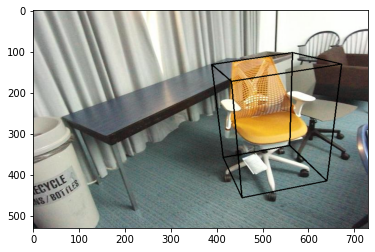

In [9]:
# draw_sample_image('000002_2014-05-26_14-23-37_260595134347_rgbf000103-resize')
draw_sample_image('001316_2014-06-16_16-38-56_260595134347_rgbf000037-resize')

In [10]:
predicted_X = np.array([[ 0.4009863 ,  1.0765753 , -0.15926272, -0.19789624, -0.27891365,
        -0.23617809,  1.5195467 ,  1.5206347 ,  1.5058571 ,  1.543524  ],
       [ 0.4283042 ,  1.0662307 , -0.11507791, -0.11163039, -0.15153116,
        -0.23888867,  1.4907284 ,  1.466741  ,  1.5485963 ,  1.6165657 ],
       [ 0.42919406,  1.1072943 , -0.14019091, -0.15511933, -0.20430094,
        -0.14249021,  1.5735509 ,  1.4805515 ,  1.516886  ,  1.6409643 ],
       [ 0.39637917,  1.1404443 , -0.07107676, -0.05016877,  0.07926704,
        -0.1019162 ,  1.8620148 ,  1.5566443 ,  1.687626  ,  2.0497434 ],
       [ 0.3928473 ,  1.155786  , -0.17575395, -0.23291108, -0.16872147,
        -0.17400968,  1.546263  ,  1.4094223 ,  1.4252734 ,  1.5768317 ],
       [ 0.422849  ,  1.0968893 , -0.13878062, -0.14887094, -0.04577526,
        -0.08827326,  1.8586514 ,  1.5713136 ,  1.7391957 ,  1.9665766 ],
       [ 0.43058622,  1.1291766 , -0.15314339, -0.13505672, -0.13905883,
        -0.12465794,  1.6660717 ,  1.51633   ,  1.6263506 ,  1.822351  ],
       [ 0.4333986 ,  1.172363  , -0.14856787, -0.18397862, -0.301848  ,
        -0.21681692,  1.7687919 ,  1.7527393 ,  1.761969  ,  1.8036351 ],
       [ 0.44289488,  1.2446376 , -0.19257857, -0.18943176, -0.17123185,
        -0.14621888,  1.8358798 ,  1.6218445 ,  1.7206432 ,  1.9483516 ],
       [ 0.4107899 ,  1.0043653 , -0.15647317, -0.20081982, -0.2341676 ,
        -0.2238752 ,  1.1920855 ,  1.2422752 ,  1.1981728 ,  1.1753671 ]],
      dtype=np.float32)

predicted_names = [
    '001559_2014-06-20_17-13-59_260595134347_rgbf000081-resize',
    '002975_2014-06-08_18-26-45_094959634447_rgbf000151-resize',
    '003484_2014-05-21_15-30-35_094959634447_rgbf000101-resize',
    '001431_2014-06-19_16-50-55_260595134347_rgbf000040-resize',
    '000107_2014-04-14_00-03-38_094959634447_rgbf000052-resize',
    '000502_2014-06-08_23-02-32_260595134347_rgbf000063-resize',
    '000871_2014-06-09_20-50-55_260595134347_rgbf000085-resize',
    '003509_2014-05-21_17-31-37_094959634447_rgbf000101-resize',
    '000543_2014-06-08_18-40-53_260595134347_rgbf000085-resize',
    '003080_2014-06-15_15-18-47_094959634447_rgbf000150-resize',
]

In [52]:
def predict_to_3dbb(predicted):
    
    ret_boxes = []
    
    for vect in predicted:
        bounding_box_3d = {}
        
        bounding_box_3d['Ymin'] = vect[0]
        bounding_box_3d['Ymax'] = vect[1]
        bounding_box_3d['X'] = vect[2:6]
        bounding_box_3d['Z'] = vect[6:]

        ret_boxes.append(bounding_box_3d)
        
    return ret_boxes

In [54]:
predicted_3dbb = predict_to_3dbb(predicted_X)

predicted_3dbb[0]

{'Ymin': 0.4009863,
 'Ymax': 1.0765753,
 'X': array([-0.15926272, -0.19789624, -0.27891365, -0.23617809], dtype=float32),
 'Z': array([1.5195467, 1.5206347, 1.5058571, 1.543524 ], dtype=float32)}

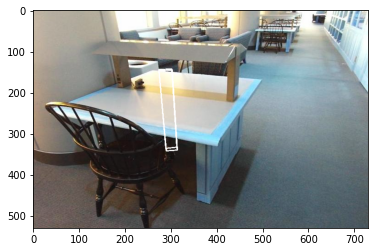

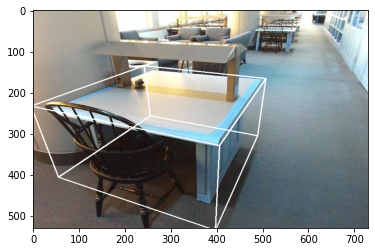

In [57]:
draw_sample_image_with_3dbb(predicted_names[0], predicted_3dbb[0])
draw_sample_image(predicted_names[0])

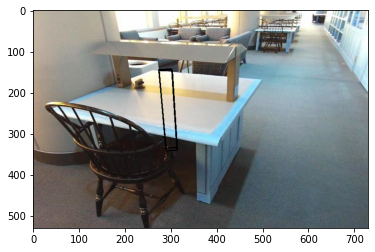

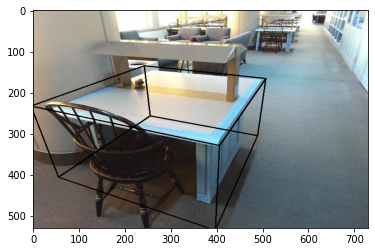

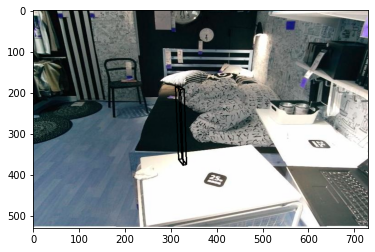

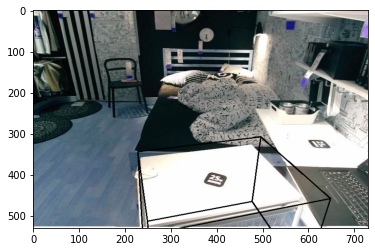

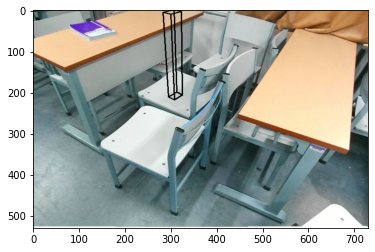

...

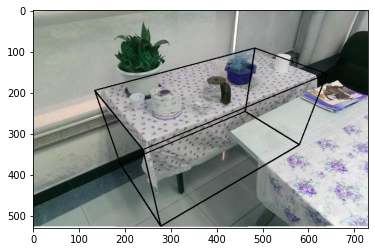

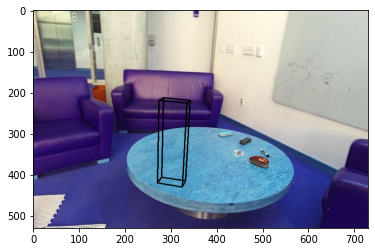

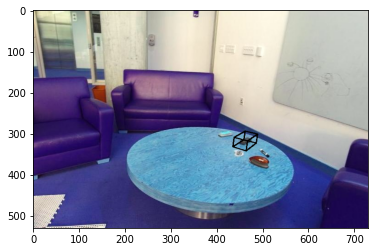

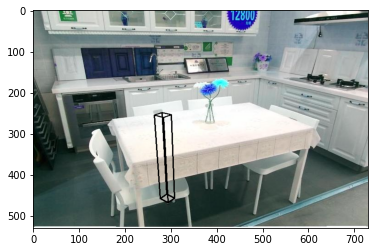

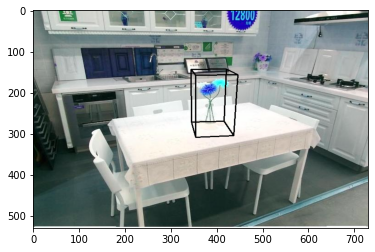

In [62]:
for i in range(len(predicted_3dbb)):
    draw_sample_image_with_3dbb(predicted_names[i], predicted_3dbb[i])
    draw_sample_image(predicted_names[i])

In [63]:
predict_X_mobile = np.array([[ 0.8681037 ,  2.2453978 , -1.3434474 , -1.0250592 , -0.6005838 ,
                    -0.8073025 ,  3.9888465 ,  4.627757  ,  6.0925193 ,  5.2211947 ],
                   [ 0.32019383,  1.5107512 , -0.9654787 , -0.71455497, -0.68228525,
                    -0.63396996,  3.1225114 ,  3.521776  ,  4.1722856 ,  3.995914  ],
                   [ 0.07234147,  1.1354907 , -0.54193556,  0.04001895,  0.11766707,
                    -0.3059846 ,  1.871883  ,  2.597457  ,  3.3607578 ,  2.9572494 ],
                   [ 0.5255965 ,  2.115687  , -1.0049106 , -0.7758048 ,  0.37179786,
                     0.01096853,  4.3966007 ,  4.3517013 ,  5.2223034 ,  5.3788843 ],
                   [ 0.4459508 ,  1.5745132 , -0.9317887 , -0.9270668 ,  0.06291926,
                     0.09862518,  3.6484866 ,  3.5387428 ,  4.1300974 ,  4.357095  ],
                   [ 0.29869863,  1.1794318 , -0.737398  , -0.87840897, -0.86136585,
                    -0.64656943,  2.2813013 ,  3.0809705 ,  3.9291356 ,  3.2441702 ],
                   [ 0.6050006 ,  2.0093424 , -0.9350057 , -0.86124194, -0.75683767,
                    -0.63826084,  3.4613826 ,  3.9601688 ,  4.8554406 ,  4.347694  ],
                   [ 0.24242458,  1.2363266 , -0.26185876,  0.34516737, -0.13138832,
                    -0.34118077,  2.1138382 ,  2.7849832 ,  3.6416197 ,  2.9208672 ],
                   [ 0.4331952 ,  2.0136888 , -0.7398613 , -0.4278369 , -0.18329094,
                    -0.22600092,  3.762013  ,  4.1489015 ,  5.1829686 ,  5.097702  ],
                   [ 0.34734964,  1.368913  , -0.3648923 , -0.27654693, -0.13447885,
                    -0.4643683 ,  2.2317655 ,  2.8072753 ,  3.549991  ,  3.3372238 ]],
                  dtype=np.float32)

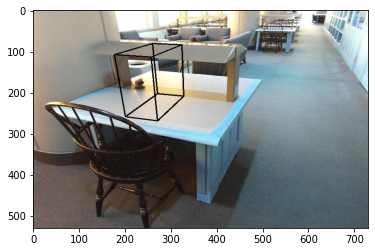

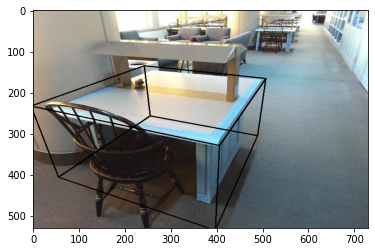

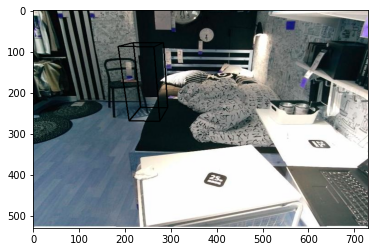

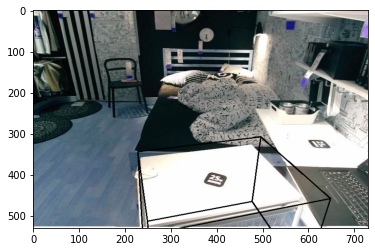

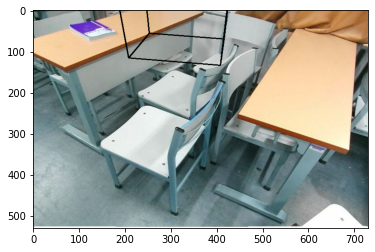

...

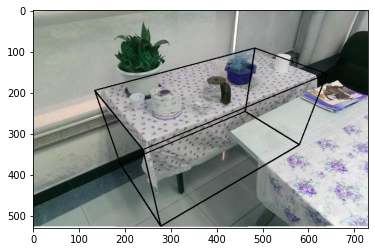

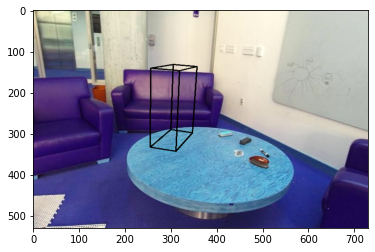

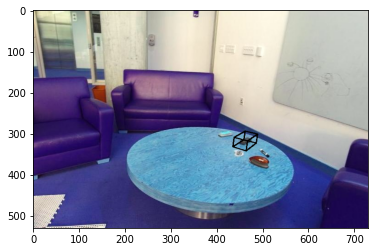

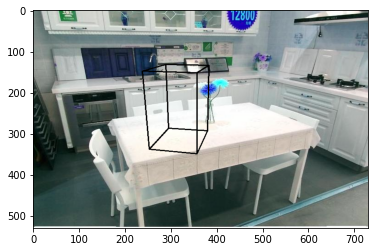

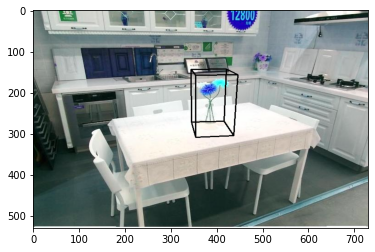

In [64]:
predicted_3dbb_mobile = predict_to_3dbb(predict_X_mobile)


for i in range(len(predicted_3dbb_mobile)):
    draw_sample_image_with_3dbb(predicted_names[i], predicted_3dbb_mobile[i])
    draw_sample_image(predicted_names[i])

In [21]:
predicted_3d_bb_full_batch = np.array([[ 0.5947903 ,  0.03338531,  0.7555923 , -0.05594098,  0.09323326,
                                        -0.04213448,  0.3013    ,  0.02625947,  0.59719944,  0.42738992,
                                         0.6907852 ,  0.65146375,  0.18205884,  0.71817905,  0.33220476,
                                         0.3628307 3],
                                       [ 0.6111247 , -0.03335515,  0.7503564 , -0.09118991,  0.09218966,
                                        -0.13181916,  0.32746598, -0.05178695,  0.5810176 ,  0.34099674,
                                         0.6795004 ,  0.62910414,  0.14276448,  0.5498018 ,  0.35119462,
                                         0.29331014],
                                       [ 0.696516  ,  0.00975608,  0.7627149 , -0.07155082,  0.11498044,
                                        -0.09958296,  0.3556094 , -0.00448688,  0.6850904 ,  0.3935785 ,
                                         0.7029366 ,  0.65622437,  0.18544096,  0.63734764,  0.3252579 ,
                                         0.39137936],
                                       [ 0.7119347 ,  0.01045356,  0.764726  , -0.07278231,  0.09136731,
                                         0.00512054,  0.3153427 , -0.00118078,  0.5648794 ,  0.36645657,
                                         0.68555814,  0.665959  ,  0.18781638,  0.60004354,  0.33556944,
                                         0.3453894 ],
                                       [ 0.5883431 , -0.00954562,  0.75135124, -0.02492616,  0.0600346 ,
                                        -0.04859156,  0.31718883,  0.02830475,  0.5480372 ,  0.33503777,
                                         0.65349895,  0.63247657,  0.14635283,  0.6313217 ,  0.31757587,
                                         0.3534684 ],
                                       [ 0.67574793,  0.03673737,  0.79843676,  0.00130638,  0.11866266,
                                        -0.07414577,  0.34321302,  0.06453751,  0.6735194 ,  0.34392434,
                                         0.7519259 ,  0.77715075,  0.15142962,  0.71120733,  0.4053281 ,
                                         0.441884  ],
                                       [ 0.5807672 ,  0.01581986,  0.7638416 , -0.1237563 ,  0.06085563,
                                        -0.0296489 ,  0.34435976,  0.03484013,  0.63760674,  0.31172863,
                                         0.6509647 ,  0.6580217 ,  0.15914841,  0.63187957,  0.31556225,
                                         0.34595683],
                                       [ 0.6142199 ,  0.0334314 ,  0.77068824, -0.04253517,  0.06296206,
                                        -0.06611264,  0.30079618, -0.04193985,  0.5905992 ,  0.36912465,
                                         0.6740659 ,  0.60590065,  0.14210217,  0.6156506 ,  0.30894834,
                                         0.3939296 ],
                                       [ 0.6424759 ,  0.01433999,  0.72655207, -0.06309237,  0.08476592,
                                        -0.05219406,  0.326557  ,  0.04258766,  0.56355643,  0.35917002,
                                         0.6450038 ,  0.65106416,  0.13681452,  0.61220473,  0.30089945,
                                         0.370247  ],
                                       [ 0.64476   , -0.03792145,  0.77247465, -0.05273359,  0.05301699,
                                        -0.06668644,  0.3153279 ,  0.04761362,  0.6081625 ,  0.38119856,
                                         0.7166926 ,  0.7231227 ,  0.15647413,  0.6189036 ,  0.35114712,
                                         0.34537286]], dtype=np.float32)

print(predicted_3d_bb_full_batch.shape)
predicted_3d_bb_full_batch[0]

(10, 16)


array([ 0.5947903 ,  0.03338531,  0.7555923 , -0.05594098,  0.09323326,
       -0.04213448,  0.3013    ,  0.02625947,  0.59719944,  0.42738992,
        0.6907852 ,  0.65146375,  0.18205884,  0.71817905,  0.33220476,
        0.36283073], dtype=float32)

In [22]:
predicted_3d_bb_full_batch = predicted_3d_bb_full_batch.reshape(10, 8, 2)
print(predicted_3d_bb_full_batch.shape)
predicted_3d_bb_full_batch[:, :, 0] *= WIDTH
predicted_3d_bb_full_batch[:, :, 1] *= HEIGHT

(10, 8, 2)


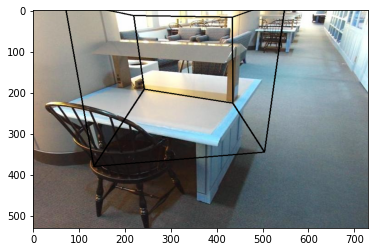

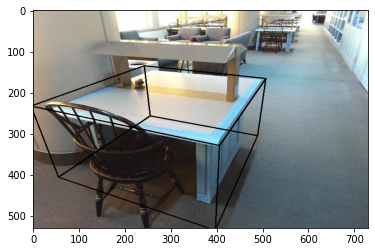

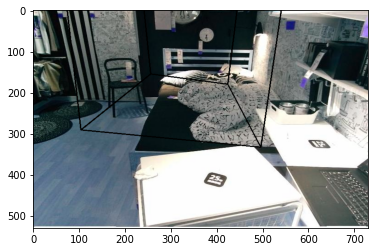

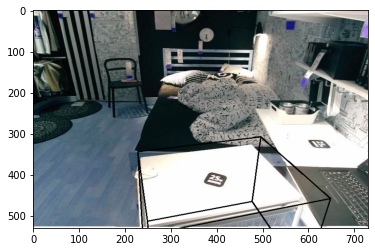

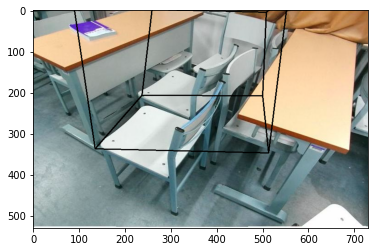

...

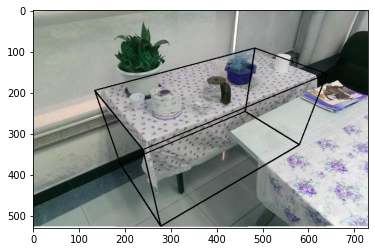

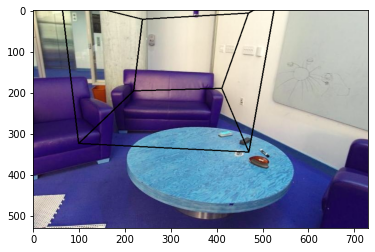

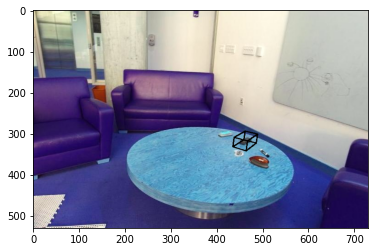

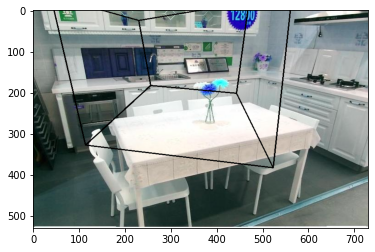

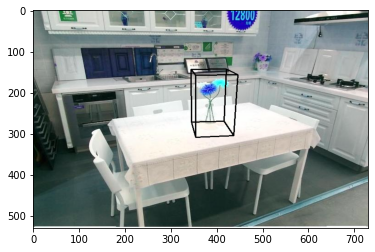

In [27]:
for i in range(predicted_3d_bb_full_batch.shape[0]):
    draw_sample_image_with_3dbb_from_corners(predicted_names[i], predicted_3d_bb_full_batch[i])
    draw_sample_image(predicted_names[i])